# JULIA FOR STATISTICS AND DATA SCIENCE. YOUR FIRST STEPS IN STATISTICS AND INTEGRATION WITH YOUR CURRENT PLATFORM. 

*An [SSA](https://www.statsoc.org.au/) workshop by [Yoni Nazarathy](https://yoninazarathy.com/), July 8-9, 2021.*


## Introductory Examples (taken from [Statistics with Julia](https://statisticswithjulia.org/) - SWJ)

---
#### Some basic code
Example adapated SWJ-Chapter 1, https://github.com/h-Klok/StatsWithJuliaBook/blob/master/1_chapter/hailstoneHistogram.jl

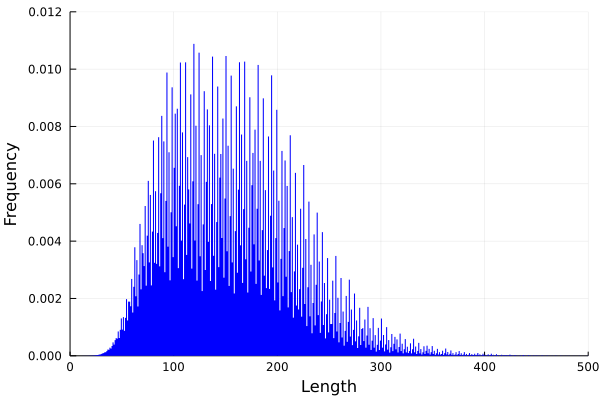

In [1]:
using Plots

function hailLength(x::Int)
    n = 0
    while x != 1
        if x % 2 == 0
            x = Int(x/2)
        else
            x = 3x +1
        end
        n += 1
    end
    return n
end

lengths = [hailLength(x0) for x0 in 2:10^7]

histogram(lengths, bins=1000, normed=:true, 
    fill=(:blue, true), la=0, legend=:none,
    xlims=(0, 500), ylims=(0, 0.012),
    xlabel="Length", ylabel="Frequency")

---
#### HTTP, JSON, and Dictionaries
Example adapated SWJ-Chapter 1, https://github.com/h-Klok/StatsWithJuliaBook/blob/master/1_chapter/shakespeareWords.jl

In [2]:
using HTTP, JSON

data = HTTP.request("GET",
"https://ocw.mit.edu/ans7870/6/6.006/s08/lecturenotes/files/t8.shakespeare.txt")
shakespeare = String(data.body)
shakespeareWords = split(shakespeare)

jsonWords = HTTP.request("GET",
"https://raw.githubusercontent.com/"*
"h-Klok/StatsWithJuliaBook/master/data/jsonCode.json")
parsedJsonDict = JSON.parse( String(jsonWords.body))

keywords = Array{String}(parsedJsonDict["words"])
numberToShow = parsedJsonDict["numToShow"]
wordCount = Dict([(x,count(w -> lowercase(w) == lowercase(x), shakespeareWords))
                  for x in keywords])

sortedWordCount = sort(collect(wordCount),by=last,rev=true)
display(sortedWordCount[1:numberToShow])

5-element Vector{Pair{String, Int64}}:
 "king" => 1698
 "love" => 1279
  "man" => 1033
  "sir" => 721
  "god" => 555

---

#### Linear Algebra and Randomness
Example adapated SWJ-Chapter 1, https://github.com/h-Klok/StatsWithJuliaBook/blob/master/1_chapter/multiWayMarkovChainStationary.jl

In [3]:
using LinearAlgebra, StatsBase

# Transition probability matrix
P = [0.5 0.4 0.1;
     0.3 0.2 0.5;
     0.5 0.3 0.2]

# First way
piProb1 = (P^100)[1,:]

# Second way
A = vcat((P' - I)[1:2,:],ones(3)')
b = [0 0 1]'
piProb2 = A\b

# Third way
eigVecs = eigvecs(copy(P'))
highestVec = eigVecs[:,findmax(abs.(eigvals(P)))[2]]
piProb3 = Array{Float64}(highestVec)/norm(highestVec,1)

# Fourth way
numInState = zeros(Int,3)
state = 1
N = 10^6
for t in 1:N
    numInState[state] += 1
    global state = sample(1:3,weights(P[state,:]))
end
piProb4 = numInState/N

display([piProb1 piProb2 piProb3 piProb4])

3×4 Matrix{Float64}:
 0.4375  0.4375  0.4375  0.438518
 0.3125  0.3125  0.3125  0.312126
 0.25    0.25    0.25    0.249356

In [ ]:
using CSV, DataFrames, RCall

data1 = CSV.read("../data/machine1.csv", header=false)[:,1]
data2 = CSV.read("../data/machine2.csv", header=false)[:,1]
data3 = CSV.read("../data/machine3.csv", header=false)[:,1]

function R_ANOVA(allData)
    data = vcat([ [x fill(i, length(x))] for (i, x) in
    			enumerate(allData) ]...)
    df = DataFrame(data, [:Diameter, :MachNo])
    @rput df

    R"""
    df$MachNo <- as.factor(df$MachNo)
    anova <- summary(aov( Diameter ~ MachNo, data=df))
    fVal <- anova[[1]]["F value"][[1]][1]
    pVal <- anova[[1]]["Pr(>F)"][[1]][1]
    """
    println("R ANOVA f-value: ", @rget fVal)
    println("R ANOVA p-value: ", @rget pVal)
end

R_ANOVA([data1, data2, data3])

---
## An epidemic model simulation

In [4]:
"""
Returns an array of points around the point (i,j) to which we can move.

Assumes global values `M` and `N`.
"""
function calc_move_options(i,j)
    options = Array{Array{Int,1},1}(undef,0)
    for k = i-1:i+1
        for l = j-1:j+1
            [k,l] != [i,j] && push!(options,[k,l])
        end
    end
    filter((c)->(c[1]>0 && c[1]<=M && c[2]>0 && c[2]<=N),  options)
end

calc_move_options

In [5]:
? calc_move_options

search: calc_move_options



Returns an array of points around the point (i,j) to which we can move.

Assumes global values `M` and `N`.


In [6]:
"""
Sets global parameters.
"""
function init_params(;
    γ_ = 0.2, #aspect ratio (height/width)
    ρ_ = 0.2, #density
    p₀_ = 0.01, #initial infection
    μ_ = 15, #mean infection duration
    area_ = 10^4, # ≈ M*N,
    verbose = true
    )

    global γ = γ_
    global ρ = ρ_
    global p₀ = p₀_
    global μ = μ_
    global N = Int(round(sqrt(area_/γ))) #Based on area and aspect ratio we can get N
    
    global M = Int(round(γ * N)) #height of space implied by aspect ratio
    verbose && @show M
    verbose && @show M*N

    global n = Int(floor(ρ*M*N)) #number of agents implied by area and 
    verbose && @show n;

    global move_options = [calc_move_options(i,j) for i in 1:M, j in 1:N]
end

init_params()
length.(move_options)

M = 45
M * N = 10080
n = 2016


45×224 Matrix{Int64}:
 3  5  5  5  5  5  5  5  5  5  5  5  5  …  5  5  5  5  5  5  5  5  5  5  5  3
 5  8  8  8  8  8  8  8  8  8  8  8  8     8  8  8  8  8  8  8  8  8  8  8  5
 5  8  8  8  8  8  8  8  8  8  8  8  8     8  8  8  8  8  8  8  8  8  8  8  5
 5  8  8  8  8  8  8  8  8  8  8  8  8     8  8  8  8  8  8  8  8  8  8  8  5
 5  8  8  8  8  8  8  8  8  8  8  8  8     8  8  8  8  8  8  8  8  8  8  8  5
 5  8  8  8  8  8  8  8  8  8  8  8  8  …  8  8  8  8  8  8  8  8  8  8  8  5
 5  8  8  8  8  8  8  8  8  8  8  8  8     8  8  8  8  8  8  8  8  8  8  8  5
 5  8  8  8  8  8  8  8  8  8  8  8  8     8  8  8  8  8  8  8  8  8  8  8  5
 5  8  8  8  8  8  8  8  8  8  8  8  8     8  8  8  8  8  8  8  8  8  8  8  5
 5  8  8  8  8  8  8  8  8  8  8  8  8     8  8  8  8  8  8  8  8  8  8  8  5
 5  8  8  8  8  8  8  8  8  8  8  8  8  …  8  8  8  8  8  8  8  8  8  8  8  5
 5  8  8  8  8  8  8  8  8  8  8  8  8     8  8  8  8  8  8  8  8  8  8  8  5
 5  8  8  8  8  8  8  8  8  8  8  8  8    

In [7]:
"""
The basic agent structure.
"""
mutable struct Agent
    vert_loc::Int
    horz_loc::Int
    state::Symbol
    time_sick_left::Int
    id::Int
end
Agent(rand(1:M),rand(1:N),:S,10,1)

Agent(31, 223, :S, 10, 1)

In [8]:
"""
Move an agent to a random position.
"""
function move!(agent::Agent)
    i, j = rand(move_options[agent.vert_loc,agent.horz_loc])
    agent.vert_loc, agent.horz_loc = i, j
    agent
end

move!

In [9]:
agent = Agent(1,1,:S,10,1)
for _ in 1:20
    move!(agent)  
    @show agent.vert_loc, agent.horz_loc
end

(agent.vert_loc, agent.horz_loc) = (1, 2)
(agent.vert_loc, agent.horz_loc) = (2, 2)
(agent.vert_loc, agent.horz_loc) = (1, 3)
(agent.vert_loc, agent.horz_loc) = (1, 2)
(agent.vert_loc, agent.horz_loc) = (2, 3)
(agent.vert_loc, agent.horz_loc) = (1, 2)
(agent.vert_loc, agent.horz_loc) = (2, 3)
(agent.vert_loc, agent.horz_loc) = (3, 4)
(agent.vert_loc, agent.horz_loc) = (2, 3)
(agent.vert_loc, agent.horz_loc) = (1, 2)
(agent.vert_loc, agent.horz_loc) = (2, 3)
(agent.vert_loc, agent.horz_loc) = (3, 2)
(agent.vert_loc, agent.horz_loc) = (3, 3)
(agent.vert_loc, agent.horz_loc) = (3, 2)
(agent.vert_loc, agent.horz_loc) = (4, 3)
(agent.vert_loc, agent.horz_loc) = (5, 4)
(agent.vert_loc, agent.horz_loc) = (6, 4)
(agent.vert_loc, agent.horz_loc) = (5, 3)
(agent.vert_loc, agent.horz_loc) = (5, 2)
(agent.vert_loc, agent.horz_loc) = (4, 1)


In [10]:
using Distributions

"""
Duration of sickness.
"""
time_sick_init() = rand(Poisson(μ-1)) + 1

time_sick_init

In [11]:
# Checking that 
using Statistics, Random
Random.seed!(0)

test_data = [time_sick_init() for _ in 1:10^7]
mean(test_data), var(test_data), μ

(15.0001526, 13.993713976084644, 15)

In [12]:
"""
Initilize agents.
"""
init_agents() = [ Agent(rand(1:M),
                        rand(1:N),
                        rand() <= p₀ ? :I : :S,
                        time_sick_init(),
                        id) for id in 1:n]
agents = init_agents()

2016-element Vector{Agent}:
 Agent(17, 39, :S, 15, 1)
 Agent(13, 73, :S, 22, 2)
 Agent(45, 17, :I, 22, 3)
 Agent(19, 201, :S, 10, 4)
 Agent(10, 97, :S, 10, 5)
 Agent(17, 187, :S, 12, 6)
 Agent(22, 144, :S, 9, 7)
 Agent(2, 68, :S, 13, 8)
 Agent(34, 130, :S, 20, 9)
 Agent(4, 197, :S, 10, 10)
 Agent(40, 75, :S, 22, 11)
 Agent(22, 6, :S, 16, 12)
 Agent(18, 170, :S, 8, 13)
 ⋮
 Agent(35, 181, :S, 17, 2005)
 Agent(8, 129, :S, 22, 2006)
 Agent(4, 103, :S, 16, 2007)
 Agent(35, 155, :S, 14, 2008)
 Agent(26, 59, :S, 15, 2009)
 Agent(15, 64, :S, 22, 2010)
 Agent(18, 90, :S, 11, 2011)
 Agent(5, 123, :S, 11, 2012)
 Agent(8, 191, :S, 20, 2013)
 Agent(15, 60, :S, 21, 2014)
 Agent(25, 143, :S, 15, 2015)
 Agent(27, 212, :S, 11, 2016)

In [13]:
using Plots, Distributions

δ = 0.1;
noise() = rand(Uniform(-0.1,0.1))
function illustrate_agents(agents::Vector{Agent}; title = "")
    plot(Shape([1-2δ,N+2δ,N+2δ,1-2δ],[1-2δ,1-2δ,M+2δ,M+2δ]),c=:black,label=:none)

    s_agents = filter((a)->a.state == :S,agents)
    x = [a.horz_loc + noise() for a in s_agents]
    y = [a.vert_loc + noise() for a in s_agents]
    scatter!(x, y, 
        c = :green,
        label="Susceptible")
    
    r_agents = filter((a)->a.state == :R,agents)
    x = [a.horz_loc + noise() for a in r_agents]
    y = [a.vert_loc + noise() for a in r_agents]
    scatter!(x, y, 
        c = :yellow,
        label="Removed")

    i_agents = filter((a)->a.state == :I,agents)
    x = [a.horz_loc + noise() for a in i_agents]
    y = [a.vert_loc + noise() for a in i_agents]
    scatter!(x, y, 
        xlim = (0,N+1), ylim = (0,M+1),
        c = :red,
        #framestyle=:none,
        label="Infected",
        legend = :outertopright,
        aspectratio = 1,title = title)
    
end

illustrate_agents (generic function with 1 method)

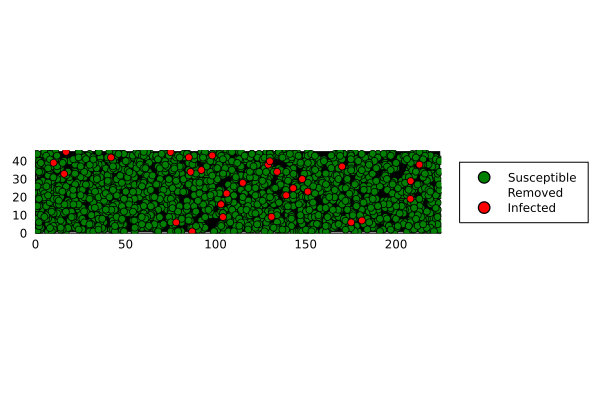

In [14]:
illustrate_agents(agents)

┌ Info: Saved animation to 
│   fn = /Users/uqjnazar/stub-animation.gif
└ @ Plots /Users/uqjnazar/.julia/packages/Plots/lzHOt/src/animation.jl:104


Plots.AnimatedGif("/Users/uqjnazar/stub-animation.gif")
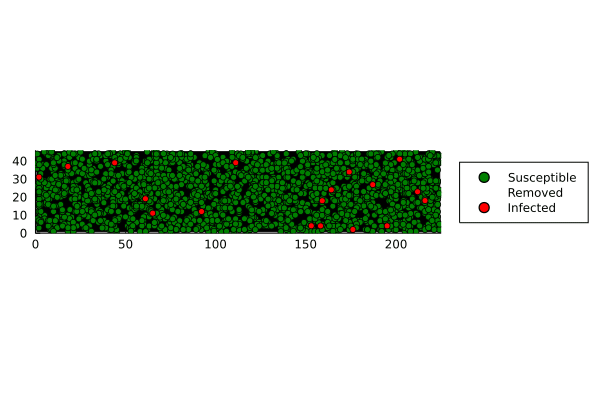

In [15]:
# Demonsration of creation of an animation
using Random
Random.seed!(0)
agents = init_agents()
anim = Animation()
for _ in 1:100
    move!.(agents)
    illustrate_agents(agents)
    frame(anim)
end

gif(anim, "stub-animation.gif", fps = 15)

In [16]:
# Query functions for the aggregate of the epidemic
numS(agents) = count((a)->a.state == :S, agents)
numI(agents) = count((a)->a.state == :I, agents)
numR(agents) = count((a)->a.state == :R, agents)

numR (generic function with 1 method)

In [17]:
Random.seed!(0)
agents = init_agents()
@show n
numS(agents),numI(agents),numR(agents)

n = 2016


(1998, 18, 0)

In [18]:
"""
Take a specific `agent` and the vector of all `agents` and infect agent if it is in state `:S` and 
is in the same cell as another infected agent.
"""
function consider_infections(agent::Agent,agents::Vector{Agent})
    agent.state != :S && return
    for a in agents
        agent.id == a.id && continue
        if (agent.vert_loc,agent.horz_loc) == (a.vert_loc, a.horz_loc)
            #println("same location for $(agent.id) and $(a.id)")
            if a.state == :I 
                #println("infecting $(agent.id)")
                agent.state = :I
            end
        end
    end
end

consider_infections

In [19]:
? consider_infections

search: consider_infections



Take a specific `agent` and the vector of all `agents` and infect agent if it is in state `:S` and  is in the same cell as another infected agent.


In [20]:
"""
Take a specific `agent` and progress their disease if currently infected. 
Once no time left for sickness agent becomes `:R`.
"""
function progress_disease(agent::Agent)
    agent.state != :I && return
    @assert agent.time_sick_left > 0
    agent.time_sick_left -= 1
    if agent.time_sick_left == 0
        agent.state = :R
    end
end

progress_disease

In [21]:
"""
Run the simulation based on the global variable parameters, modifing the global `agents`.
"""
function run_sim(call_back=(t,agents)->nothing ; Tmax = 300)
    countsS = Array{Int}(undef,0)
    countsI = Array{Int}(undef,0)
    countsR = Array{Int}(undef,0)

    agents = init_agents()
    t = 0
    while t <Tmax #numI(agents)>0 && numI(agents) <= n && 
        t+=1

        push!(countsS, numS(agents))
        push!(countsI, numI(agents))
        push!(countsR, numR(agents))

        move!.(agents)
        for a in agents
            consider_infections(a,agents)
        end
        for a in agents 
            progress_disease(a)
        end
        call_back(t,agents)
    end
    return (    time_range = 1:length(countsS),
                counts_S = countsS,
                counts_I = countsI,
                counts_R = countsR) 
end

run_sim

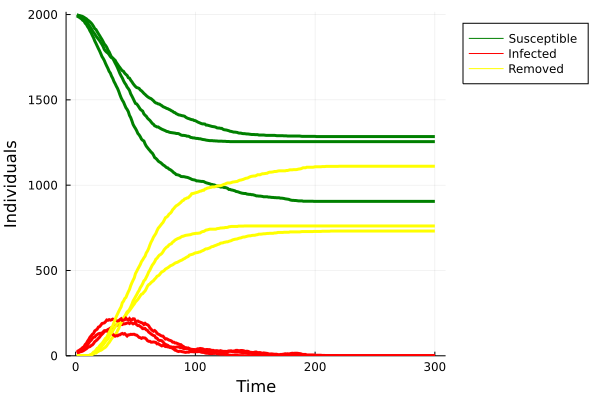

In [22]:
using Random
Random.seed!(0)

"""
Plot 3 simulation runs.
"""
function plot_3_runs()
    results1 = run_sim()
    results2 = run_sim()
    results3 = run_sim()

    plot(results1.time_range, 
        [results1.counts_S results1.counts_I results1.counts_R],
        label = false, 
        c = [:green :red :yellow],lw=3)
    plot!(results2.time_range, 
        [results2.counts_S results2.counts_I results2.counts_R],
        label = false, 
        c = [:green :red :yellow],lw=3)
    plot!(results3.time_range, 
        [results3.counts_S results3.counts_I results3.counts_R],
        label = ["Susceptible" "Infected" "Removed"], 
        c = [:green :red :yellow],
        ylim=(0,n),xlabel="Time", ylabel = "Individuals",
        legend=:outertopright,lw=3)
end
plot_3_runs()

M = 45
M * N = 10080
n = 2016
γ = 0.2


┌ Info: Saved animation to 
│   fn = /Users/uqjnazar/epidemic-animation.gif
└ @ Plots /Users/uqjnazar/.julia/packages/Plots/lzHOt/src/animation.jl:104


Plots.AnimatedGif("/Users/uqjnazar/epidemic-animation.gif")
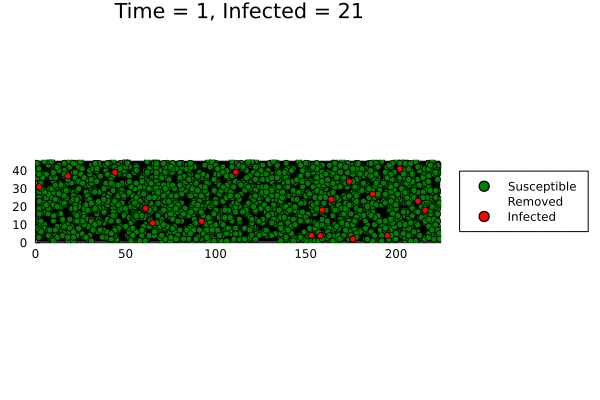

In [36]:
using Random
Random.seed!(0)

init_params() #default
function make_animation(;filename = "epidemic-animation.gif", Tanim = 200)
    anim = Animation()
    run_sim((t,agents)->begin
                            if t <= Tanim
                                illustrate_agents(agents,title = "Time = $t, Infected = $(numI(agents))")
                                frame(anim)
                            end
                        end)
    gif(anim, filename, fps = 5)
end
@show γ
make_animation()

M = 32
M * N = 10112
n = 2022


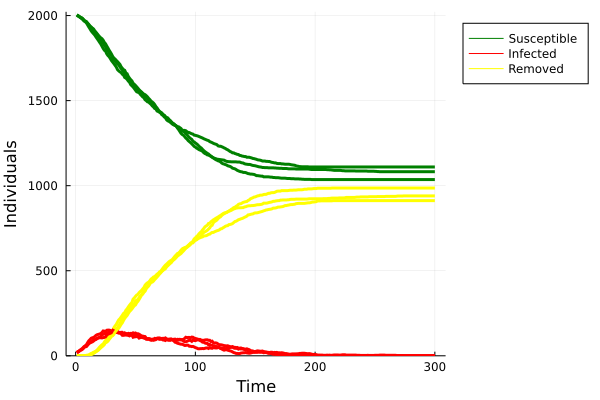

In [24]:
Random.seed!(0)
init_params(γ_=0.1)
plot_3_runs()

M = 32
M * N = 10112
n = 2022


┌ Info: Saved animation to 
│   fn = /Users/uqjnazar/graph.gif
└ @ Plots /Users/uqjnazar/.julia/packages/Plots/lzHOt/src/animation.jl:104


Plots.AnimatedGif("/Users/uqjnazar/graph.gif")
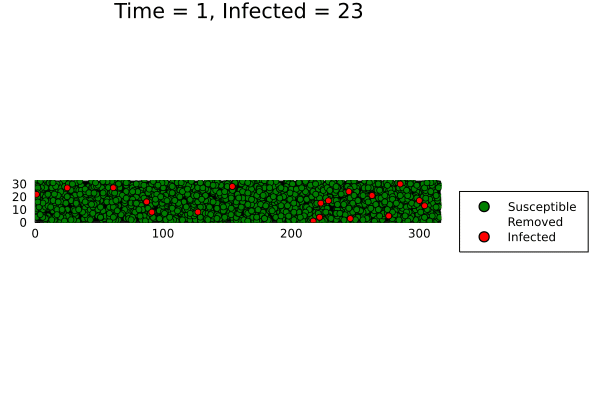

In [25]:
Random.seed!(0)
init_params(γ_=0.1)
make_animation()

## Doing some statistics

In [26]:
x_vals = Vector{Float64}(undef,0)
y_vals = Vector{Float64}(undef,0)
repeats = 10
for γ_ in 0.005:0.005:0.03
    println("======")
    @show γ_
    init_params(γ_ = γ_, verbose = true)
    for _ in 1:repeats
        push!(x_vals,γ_)
        push!(y_vals, (run_sim().counts_R)[end]/n)
    end 
end

γ_ = 0.005
M = 7
M * N = 9898
n = 1979
γ_ = 0.01
M = 10
M * N = 10000
n = 2000
γ_ = 0.015
M = 12
M * N = 9792
n = 1958
γ_ = 0.02
M = 14
M * N = 9898
n = 1979
γ_ = 0.025
M = 16
M * N = 10112
n = 2022
γ_ = 0.03
M = 17
M * N = 9809
n = 1961


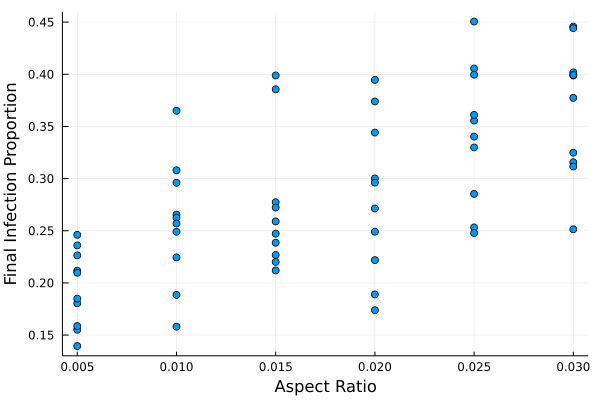

In [27]:
scatter(x_vals,y_vals,xlabel="Aspect Ratio",ylabel="Final Infection Proportion",legend=false)

In [28]:
using DataFrames
df = DataFrame(γ = x_vals, final_I = y_vals);

In [29]:
using GLM
model = lm(@formula(final_I ~ γ),df)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

final_I ~ 1 + γ

Coefficients:
───────────────────────────────────────────────────────────────────────
                Coef.  Std. Error     t  Pr(>|t|)  Lower 95%  Upper 95%
───────────────────────────────────────────────────────────────────────
(Intercept)  0.173708   0.0181256  9.58    <1e-12   0.137425    0.20999
γ            6.42943    0.930843   6.91    <1e-08   4.56614     8.29271
───────────────────────────────────────────────────────────────────────

In [30]:
γ_pred_range = 0:0.001:0.03
preds = predict(model,DataFrame(γ=γ_pred_range))

31-element Vector{Union{Missing, Float64}}:
 0.17370757768941106
 0.1801370048382008
 0.18656643198699058
 0.19299585913578032
 0.1994252862845701
 0.20585471343335984
 0.21228414058214962
 0.21871356773093936
 0.2251429948797291
 0.23157242202851888
 0.23800184917730866
 0.2444312763260984
 0.25086070347488815
 ⋮
 0.2958666935164165
 0.3022961206652062
 0.30872554781399597
 0.3151549749627857
 0.32158440211157546
 0.32801382926036526
 0.334443256409155
 0.34087268355794476
 0.34730211070673456
 0.35373153785552425
 0.36016096500431405
 0.3665903921531038

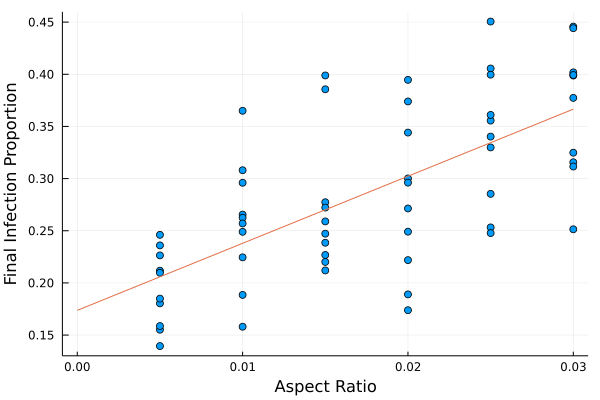

In [31]:
scatter(x_vals,y_vals,xlabel="Aspect Ratio",ylabel="Final Infection Proportion",legend=false)
plot!(γ_pred_range,preds)

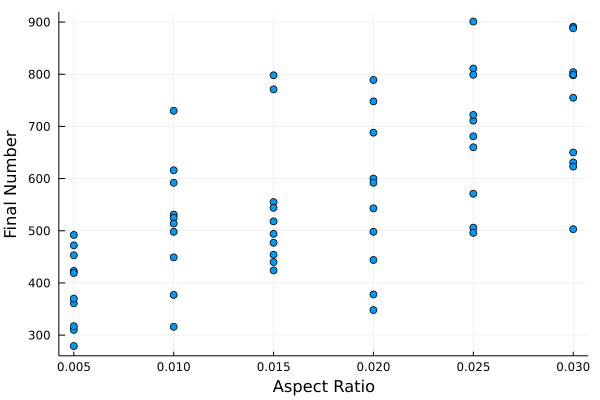

In [32]:
df.final_approx = round.(df.final_I*2000);
scatter(x_vals,df.final_approx,xlabel="Aspect Ratio",ylabel="Final Number",legend=false)

In [33]:
model2 = glm(@formula(final_approx ~ γ),df,Poisson(), LogLink())
# glm(form, train, 

StatsModels.TableRegressionModel{GeneralizedLinearModel{GLM.GlmResp{Vector{Float64}, Poisson{Float64}, LogLink}, GLM.DensePredChol{Float64, Cholesky{Float64, Matrix{Float64}}}}, Matrix{Float64}}

final_approx ~ 1 + γ

Coefficients:
─────────────────────────────────────────────────────────────────────────
                Coef.  Std. Error       z  Pr(>|z|)  Lower 95%  Upper 95%
─────────────────────────────────────────────────────────────────────────
(Intercept)   5.93492   0.0133737  443.77    <1e-99    5.90871    5.96113
γ            22.65      0.639383    35.42    <1e-99   21.3969    23.9032
─────────────────────────────────────────────────────────────────────────

In [34]:
preds2 = predict(model2,DataFrame(γ=γ_pred_range));

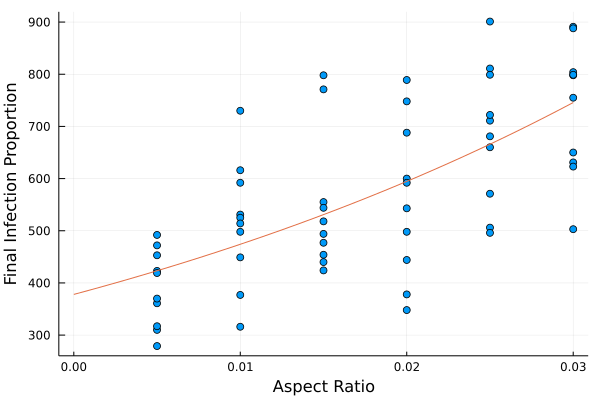

In [35]:
scatter(x_vals,df.final_approx,xlabel="Aspect Ratio",ylabel="Final Infection Proportion",legend=false)
plot!(γ_pred_range,preds2)